# Visualization

In this first part, we will apply some concepts of the visualization on the data from the mammography dataset of the previous practice.
We will see different visualizations and analysis, adjusting to the following scheme:

### Table of Contents

* [Visualización de las medidas](#section_1_1)
* [Gráficas de curva ROC](#section_1_2)
* [Análisis de atributos](#section_1_3)

### Load data 


In [1]:
import numpy as np
import pandas as pd

In [2]:
mamm_csv = "../data/mamografias.csv"

In [3]:
missing_values_format = ["?"]
mamm_data = pd.read_csv(mamm_csv, na_values=missing_values_format)
mamm_data.head()

,BI-RADS,Age,Shape,Margin,Density,Severity
0,5.0,67.0,L,5.0,3.0,maligno
1,4.0,43.0,R,1.0,NaN,maligno
2,5.0,58.0,I,5.0,3.0,maligno
3,4.0,28.0,R,1.0,3.0,benigno
4,5.0,74.0,R,5.0,NaN,maligno


In [4]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
#convert the categorical columns into numeric
mamm_data['Severity'] = le.fit_transform(mamm_data['Severity'])
mamm_data['Shape'] = le.fit_transform(mamm_data['Shape'])

## Visualización de las medidas con distintos preprocesamientos <a class="anchor" id="section_1_1"></a>


In [5]:
mamm_data.shape

(961, 6)

In [6]:
mamm_data_without_nan = mamm_data.dropna()

In [7]:
mamm_data_without_nan.shape

(847, 6)

In [8]:
objetive = ['Severity']
cols = [col for col in mamm_data.columns if col not in objetive]
data = mamm_data[cols]
target = mamm_data[objetive]

In [9]:
data_no_nan = mamm_data_without_nan[cols]
target_no_nan = mamm_data_without_nan[objetive]

In [10]:
from sklearn.model_selection import train_test_split

Para *evaluar* un algoritmo de ML es necesario dividir el conjunto de datos en dos partes:
    
- Conjunto de entrenamiento, utilizado para que el método de ML *aprenda*.
- Conjunto de test, para evaluar cuánto se equivoca con sus predicciones tras haber aprendido.

Para hacer la división usamos train_test_split, que divide de forma aleatoria entre conjunto de entrenamiento y test.

In [11]:
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2)
X_train_no_nan, X_test_no_nan, y_train_no_nan, y_test_no_nan = train_test_split(data_no_nan, target_no_nan, test_size=0.2, random_state = 15)

In [12]:
X_no_nan = X_train_no_nan
y_no_nan= y_train_no_nan
X = X_train
y = y_train

In [13]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)
X_no_nan_scaled = scaler.fit_transform(X_train_no_nan)
y_scaled = scaler.fit_transform(y_train)
y_no_nan_scaled = scaler.fit_transform(y_train_no_nan)

In [14]:
from sklearn.preprocessing import MinMaxScaler

min_max = MinMaxScaler()
X_min_max = min_max.fit_transform(X_train)
X_no_nan_min_max = min_max.fit_transform(X_train_no_nan)
y_min_max = min_max.fit_transform(y_train)
y_no_nan_min_max = min_max.fit_transform(y_train_no_nan)

In [15]:
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

# To use the experimental IterativeImputer, we need to explicitly ask for it:
from sklearn.experimental import enable_iterative_imputer  # noqa
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer

N_SPLITS = 5
metric = 'accuracy'

In [16]:
def get_full_score(regressor, X_full, y_full):
    full_scores = cross_val_score(regressor, X_full, y_full, scoring=metric, cv=N_SPLITS)
    return full_scores.mean(), full_scores.std()

In [17]:
def get_scores_for_imputer(regressor, imputer, X_missing, y_missing):
    estimator = make_pipeline(imputer, regressor)
    impute_scores = cross_val_score(estimator, X_missing, y_missing, scoring=metric, cv=N_SPLITS)
    return impute_scores

In [18]:
def get_impute_zero_score(regressor, X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, add_indicator=True, strategy='constant', fill_value=0)
    zero_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return zero_impute_scores.mean(), zero_impute_scores.std()

In [19]:
def get_impute_mean(regressor, X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, strategy="mean", add_indicator=True)
    mean_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return mean_impute_scores.mean(), mean_impute_scores.std()

In [20]:
def get_impute_mode(regressor, X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, strategy="most_frequent", add_indicator=True)
    mean_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return mean_impute_scores.mean(), mean_impute_scores.std()

In [21]:
def get_impute_median(regressor, X_missing, y_missing):
    imputer = SimpleImputer(missing_values=np.nan, strategy="median", add_indicator=True)
    mean_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return mean_impute_scores.mean(), mean_impute_scores.std()

In [22]:
def get_impute_knn_score(regressor, X_missing, y_missing):
    imputer = KNNImputer(missing_values=np.nan, add_indicator=True)
    knn_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return knn_impute_scores.mean(), knn_impute_scores.std()

In [23]:
def get_impute_iterative(regressor, X_missing, y_missing):
    imputer = IterativeImputer(missing_values=np.nan, add_indicator=True,random_state=0, n_nearest_features=5,sample_posterior=True)
    iterative_impute_scores = get_scores_for_imputer(regressor, imputer, X_missing, y_missing)
    return iterative_impute_scores.mean(), iterative_impute_scores.std()

In [24]:
x_labels = ['Drop missing',
            'Zero imputation',
            'Mean Imputation',
            'Median Imputation',
            'Mode Imputation',
            'KNN Imputation',
            'Iterative Imputation']

In [25]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [26]:
lr = LogisticRegression(C=0.01,penalty='l2', solver='newton-cg', random_state = 10)
knn = KNeighborsClassifier(n_neighbors = 6, metric = 'manhattan')
svc = SVC(C=1, gamma='auto', random_state=10)
rfc = RandomForestClassifier(max_depth=3, n_estimators=100, random_state=10)
gbc = GradientBoostingClassifier(n_estimators=1, max_depth=3, random_state = 10)

In [27]:
mses_lr = np.zeros(7)
stds_lr = np.zeros(7)
mses_knn = np.zeros(7)
stds_knn = np.zeros(7)
mses_svc = np.zeros(7)
stds_svc = np.zeros(7)
mses_rfc = np.zeros(7)
stds_rfc = np.zeros(7)
mses_gbc = np.zeros(7)
stds_gbc = np.zeros(7)

In [28]:
mses_lr_scaled = np.zeros(7)
stds_lr_scaled = np.zeros(7)
mses_knn_scaled = np.zeros(7)
stds_knn_scaled = np.zeros(7)
mses_svc_scaled = np.zeros(7)
stds_svc_scaled = np.zeros(7)
mses_rfc_scaled = np.zeros(7)
stds_rfc_scaled = np.zeros(7)
mses_gbc_scaled = np.zeros(7)
stds_gbc_scaled = np.zeros(7)

In [29]:
mses_lr_minmax = np.zeros(7)
stds_lr_minmax = np.zeros(7)
mses_knn_minmax = np.zeros(7)
stds_knn_minmax = np.zeros(7)
mses_svc_minmax = np.zeros(7)
stds_svc_minmax = np.zeros(7)
mses_rfc_minmax = np.zeros(7)
stds_rfc_minmax = np.zeros(7)
mses_gbc_minmax = np.zeros(7)
stds_gbc_minmax = np.zeros(7)

### No encoding

In [30]:
mses_lr[0], stds_lr[0] = get_full_score(lr, X_no_nan, y_no_nan)
mses_knn[0], stds_knn[0] = get_full_score(knn, X_no_nan, y_no_nan)
mses_svc[0], stds_svc[0] = get_full_score(svc, X_no_nan, y_no_nan)
mses_rfc[0], stds_rfc[0] = get_full_score(rfc, X_no_nan, y_no_nan)
mses_gbc[0], stds_gbc[0] = get_full_score(gbc, X_no_nan, y_no_nan)

In [31]:
mses_lr[1], stds_lr[1] = get_impute_zero_score(lr, X, y)
mses_knn[1], stds_knn[1] = get_impute_zero_score(knn, X, y)
mses_svc[1], stds_svc[1] = get_impute_zero_score(svc, X, y)
mses_rfc[1], stds_rfc[1] = get_impute_zero_score(rfc, X, y)
mses_gbc[1], stds_gbc[1] = get_impute_zero_score(gbc, X, y)

In [32]:
mses_lr[2], stds_lr[2] = get_impute_mean(lr, X, y)
mses_knn[2], stds_rfc[2] = get_impute_mean(knn, X, y)
mses_svc[2], stds_svc[2] = get_impute_mean(svc, X, y)
mses_rfc[2], stds_rfc[2] = get_impute_mean(rfc, X, y)
mses_gbc[2], stds_gbc[2] = get_impute_mean(gbc, X, y)

In [33]:

mses_lr[3], stds_lr[3] = get_impute_median(lr, X, y)
mses_knn[3], stds_knn[3] = get_impute_median(knn, X, y)
mses_svc[3], stds_svc[3] = get_impute_median(svc, X, y)
mses_rfc[3], stds_rfc[3] = get_impute_median(rfc, X, y)
mses_gbc[3], stds_gbc[3] = get_impute_median(gbc, X, y)

In [34]:
mses_lr[4], stds_lr[4] = get_impute_mode(lr, X, y)
mses_knn[4], stds_knn[4] = get_impute_mode(knn, X, y)
mses_svc[4], stds_svc[4] = get_impute_mode(svc, X, y)
mses_rfc[4], stds_rfc[4] = get_impute_mode(rfc, X, y)
mses_gbc[4], stds_gbc[4] = get_impute_mode(gbc, X, y)

In [35]:
mses_lr[5], stds_lr[5] = get_impute_knn_score(lr, X, y)
mses_knn[5], stds_knn[5] = get_impute_knn_score(knn, X, y)
mses_svc[5], stds_svc[5] = get_impute_knn_score(svc, X, y)
mses_rfc[5], stds_rfc[5] = get_impute_knn_score(rfc, X, y)
mses_gbc[5], stds_gbc[5] = get_impute_knn_score(gbc, X, y)

In [36]:
mses_lr[6], stds_lr[6] = get_impute_iterative(lr, X, y)
mses_knn[6], stds_knn[6] = get_impute_iterative(knn, X, y)
mses_svc[6], stds_svc[6] = get_impute_iterative(svc, X, y)
mses_rfc[6], stds_rfc[6] = get_impute_iterative(rfc, X, y)
mses_gbc[6], stds_gbc[6] = get_impute_iterative(gbc, X, y)

### StandardScaler

In [37]:
mses_lr_scaled[0], stds_lr_scaled[0] = get_full_score(lr, X_no_nan_scaled, y_no_nan)
mses_knn_scaled[0], stds_knn_scaled[0] = get_full_score(knn, X_no_nan_scaled, y_no_nan)
mses_svc_scaled[0], stds_svc_scaled[0] = get_full_score(svc, X_no_nan_scaled, y_no_nan)
mses_rfc_scaled[0], stds_rfc_scaled[0] = get_full_score(rfc, X_no_nan_scaled, y_no_nan)
mses_gbc_scaled[0], stds_gbc_scaled[0] = get_full_score(gbc, X_no_nan_scaled, y_no_nan)

In [38]:
mses_lr_scaled[1], stds_lr_scaled[1] = get_impute_zero_score(lr, X_scaled, y)
mses_knn_scaled[1], stds_knn_scaled[1] = get_impute_zero_score(knn, X_scaled, y)
mses_svc_scaled[1], stds_svc_scaled[1] = get_impute_zero_score(svc, X_scaled, y)
mses_rfc_scaled[1], stds_rfc_scaled[1] = get_impute_zero_score(rfc, X_scaled, y)
mses_gbc_scaled[1], stds_gbc_scaled[1] = get_impute_zero_score(gbc, X_scaled, y)

In [39]:
mses_lr_scaled[2], stds_lr_scaled[2] = get_impute_mean(lr, X_scaled, y)
mses_knn_scaled[2], stds_knn_scaled[2] = get_impute_mean(knn, X_scaled, y)
mses_svc_scaled[2], stds_svc_scaled[2] = get_impute_mean(svc, X_scaled, y)
mses_rfc_scaled[2], stds_rfc_scaled[2] = get_impute_mean(rfc, X_scaled, y)
mses_gbc_scaled[2], stds_gbc_scaled[2] = get_impute_mean(gbc, X_scaled, y)

In [40]:
mses_lr_scaled[3], stds_lr_scaled[3] = get_impute_median(lr, X_scaled, y)
mses_knn_scaled[3], stds_knn_scaled[3] = get_impute_median(knn, X_scaled, y)
mses_svc_scaled[3], stds_svc_scaled[3] = get_impute_median(svc, X_scaled, y)
mses_rfc_scaled[3], stds_rfc_scaled[3] = get_impute_median(rfc, X_scaled, y)
mses_gbc_scaled[3], stds_gbc_scaled[3] = get_impute_median(gbc, X_scaled, y)

In [41]:
mses_lr_scaled[4], stds_lr_scaled[4] = get_impute_mode(lr, X_scaled, y)
mses_knn_scaled[4], stds_knn_scaled[4] = get_impute_mode(knn, X_scaled, y)
mses_svc_scaled[4], stds_svc_scaled[4] = get_impute_mode(svc, X_scaled, y)
mses_rfc_scaled[4], stds_rfc_scaled[4] = get_impute_mode(rfc, X_scaled, y)
mses_gbc_scaled[4], stds_gbc_scaled[4] = get_impute_mode(gbc, X_scaled, y)

In [42]:
mses_lr_scaled[5], stds_lr_scaled[5] = get_impute_knn_score(lr, X_scaled, y)
mses_knn_scaled[5], stds_knn_scaled[5] = get_impute_knn_score(knn, X_scaled, y)
mses_svc_scaled[5], stds_svc_scaled[5] = get_impute_knn_score(svc, X_scaled, y)
mses_rfc_scaled[5], stds_rfc_scaled[5] = get_impute_knn_score(rfc, X_scaled, y)
mses_gbc_scaled[5], stds_gbc_scaled[5] = get_impute_knn_score(gbc, X_scaled, y)

In [43]:
mses_lr_scaled[6], stds_lr_scaled[6] = get_impute_iterative(lr, X_scaled, y)
mses_knn_scaled[6], stds_knn_scaled[6] = get_impute_iterative(knn, X_scaled, y)
mses_svc_scaled[6], stds_svc_scaled[6] = get_impute_iterative(svc, X_scaled, y)
mses_rfc_scaled[6], stds_rfc_scaled[6] = get_impute_iterative(rfc, X_scaled, y)
mses_gbc_scaled[6], stds_gbc_scaled[6] = get_impute_iterative(gbc, X_scaled, y) 

### MinMax


In [44]:
mses_lr_minmax[0], stds_lr_minmax[0] = get_full_score(lr, X_no_nan_min_max, y_no_nan_min_max)
mses_knn_minmax[0], stds_knn_minmax[0] = get_full_score(knn, X_no_nan_min_max, y_no_nan_min_max)
mses_svc_minmax[0], stds_svc_minmax[0] = get_full_score(svc, X_no_nan_min_max, y_no_nan_min_max)
mses_rfc_minmax[0], stds_rfc_minmax[0] = get_full_score(rfc, X_no_nan_min_max, y_no_nan_min_max)
mses_gbc_minmax[0], stds_gbc_minmax[0] = get_full_score(gbc, X_no_nan_min_max, y_no_nan_min_max)

In [45]:
mses_lr_minmax[1], stds_lr_minmax[1] = get_impute_zero_score(lr, X_min_max, y_min_max)
mses_knn_minmax[1], stds_knn_minmax[1] = get_impute_zero_score(knn, X_min_max, y_min_max)
mses_svc_minmax[1], stds_svc_minmax[1] = get_impute_zero_score(svc, X_min_max, y_min_max)
mses_rfc_minmax[1], stds_rfc_minmax[1] = get_impute_zero_score(rfc, X_min_max, y_min_max)
mses_gbc_minmax[1], stds_gbc_minmax[1] = get_impute_zero_score(gbc, X_min_max, y_min_max)

In [46]:
mses_lr_minmax[2], stds_lr_minmax[2] = get_impute_mean(lr, X_min_max, y_min_max)
mses_knn_minmax[2], stds_knn_minmax[2] = get_impute_mean(knn, X_min_max, y_min_max)
mses_svc_minmax[2], stds_svc_minmax[2] = get_impute_mean(svc, X_min_max, y_min_max)
mses_rfc_minmax[2], stds_rfc_minmax[2] = get_impute_mean(rfc, X_min_max, y_min_max)
mses_gbc_minmax[2], stds_gbc_minmax[2] = get_impute_mean(gbc, X_min_max, y_min_max)

In [47]:
mses_lr_minmax[3], stds_lr_minmax[3] = get_impute_median(lr, X_min_max, y_min_max)
mses_knn_minmax[3], stds_knn_minmax[3] = get_impute_median(knn, X_min_max, y_min_max)
mses_svc_minmax[3], stds_svc_minmax[3] = get_impute_median(svc, X_min_max, y_min_max)
mses_rfc_minmax[3], stds_rfc_minmax[3] = get_impute_median(rfc, X_min_max, y_min_max)
mses_gbc_minmax[3], stds_gbc_minmax[3] = get_impute_median(gbc, X_min_max, y_min_max)

In [48]:
mses_lr_minmax[4], stds_lr_minmax[4] = get_impute_mode(lr, X_min_max, y_min_max)
mses_knn_minmax[4], stds_knn_minmax[4] = get_impute_mode(knn, X_min_max, y_min_max)
mses_svc_minmax[4], stds_svc_minmax[4] = get_impute_mode(svc, X_min_max, y_min_max)
mses_rfc_minmax[4], stds_rfc_minmax[4] = get_impute_mode(rfc, X_min_max, y_min_max)
mses_gbc_minmax[4], stds_gbc_minmax[4] = get_impute_mode(gbc, X_min_max, y_min_max)

In [49]:
mses_lr_minmax[5], stds_lr_minmax[5] = get_impute_knn_score(lr, X_min_max, y_min_max)
mses_knn_minmax[5], stds_knn_minmax[5] = get_impute_knn_score(knn, X_min_max, y_min_max)
mses_svc_minmax[5], stds_svc_minmax[5] = get_impute_knn_score(svc, X_min_max, y_min_max)
mses_rfc_minmax[5], stds_rfc_minmax[5] = get_impute_knn_score(rfc, X_min_max, y_min_max)
mses_gbc_minmax[5], stds_gbc_minmax[5] = get_impute_knn_score(gbc, X_min_max, y_min_max)

In [50]:
mses_lr_minmax[6], stds_lr_minmax[6] = get_impute_iterative(lr, X_min_max, y_min_max)
mses_knn_minmax[6], stds_knn_minmax[6] = get_impute_iterative(knn, X_min_max, y_min_max)
mses_svc_minmax[6], stds_svc_minmax[6] = get_impute_iterative(svc, X_min_max, y_min_max)
mses_rfc_minmax[6], stds_rfc_minmax[6] = get_impute_iterative(rfc, X_min_max, y_min_max)
mses_gbc_minmax[6], stds_gbc_minmax[6] = get_impute_iterative(gbc, X_min_max, y_min_max)

In [51]:
import matplotlib.pyplot as plt

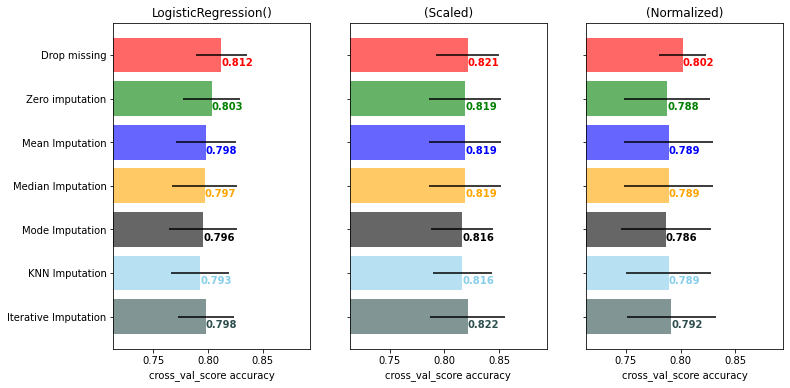

In [52]:
n_bars = len(mses_lr)
xval = np.arange(n_bars)

colors = ['r', 'g', 'b', 'orange', 'black', 'skyblue', 'darkslategray']
# plot results svc
plt.figure(figsize=(12, 6))
ax1 = plt.subplot(131)
for j in xval:
    ax1.barh(j, mses_lr[j], xerr=stds_lr[j], color=colors[j], alpha=0.6, align='center')
    ax1.text(mses_lr[j] , j + .25, str(round(mses_lr[j],3)), color=colors[j], fontweight='bold')

#ax1.set_title('LogisticRegression(C=0.01,penalty=\'l2\', solver=\'newton-cg\', random_state = 10)')
ax1.set_title('LogisticRegression()')
ax1.set_xlim(left=np.min(mses_lr) * 0.9, right=np.max(mses_lr) * 1.1)
ax1.set_yticks(xval)
ax1.set_xlabel('cross_val_score %s' % metric)
ax1.invert_yaxis()
ax1.set_yticklabels(x_labels)


# plot results svc scaled
ax2 = plt.subplot(132)
for j in xval:
    ax2.barh(j, mses_lr_scaled[j], xerr=stds_lr_scaled[j], color=colors[j], alpha=0.6, align='center')
    ax2.text(mses_lr_scaled[j] , j + .25, str(round(mses_lr_scaled[j],3)), color=colors[j], fontweight='bold')

ax2.set_title('(Scaled)')
ax2.set_xlim(left=np.min(mses_lr) * 0.9, right=np.max(mses_lr) * 1.1)
ax2.set_yticks(xval)
ax2.set_xlabel('cross_val_score %s' % metric)
ax2.invert_yaxis()
ax2.set_yticklabels([''] * n_bars)

# plot results svc minmax
ax3 = plt.subplot(133)
for j in xval:
    ax3.barh(j, mses_lr_minmax[j], xerr=stds_lr_minmax[j], color=colors[j], alpha=0.6, align='center')
    ax3.text(mses_lr_minmax[j] , j + .25, str(round(mses_lr_minmax[j],3)), color=colors[j], fontweight='bold')

ax3.set_title('(Normalized)')
ax3.set_xlim(left=np.min(mses_lr) * 0.9, right=np.max(mses_lr) * 1.1)
ax3.set_yticks(xval)
ax3.set_xlabel('cross_val_score %s' % metric)
ax3.invert_yaxis()
ax3.set_yticklabels([''] * n_bars)
plt.savefig("figures/1_visualization/preprocessing/lr.pdf")
plt.show()

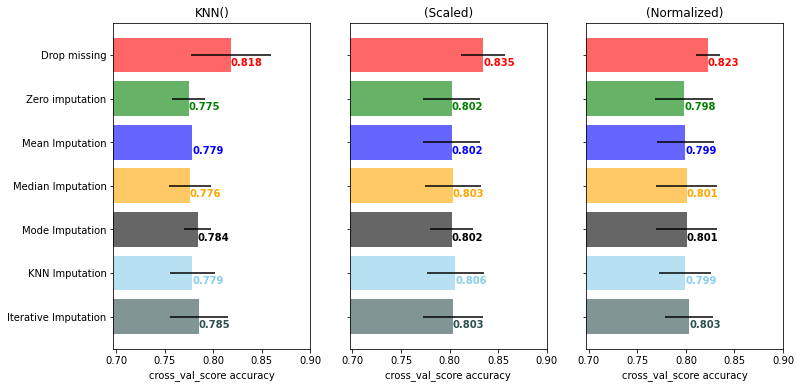

In [53]:
n_bars = len(mses_knn)
xval = np.arange(n_bars)

colors = ['r', 'g', 'b', 'orange', 'black', 'skyblue', 'darkslategray']
# plot results svc
plt.figure(figsize=(12, 6))
ax1 = plt.subplot(131)
for j in xval:
    ax1.barh(j, mses_knn[j], xerr=stds_knn[j], color=colors[j], alpha=0.6, align='center')
    ax1.text(mses_knn[j] , j + .25, str(round(mses_knn[j],3)), color=colors[j], fontweight='bold')

#ax1.set_title('LogisticRegression(C=0.01,penalty=\'l2\', solver=\'newton-cg\', random_state = 10)')
ax1.set_title('KNN()')
ax1.set_xlim(left=np.min(mses_knn) * 0.9, right=np.max(mses_knn) * 1.1)
ax1.set_yticks(xval)
ax1.set_xlabel('cross_val_score %s' % metric)
ax1.invert_yaxis()
ax1.set_yticklabels(x_labels)


# plot results svc scaled
ax2 = plt.subplot(132)
for j in xval:
    ax2.barh(j, mses_knn_scaled[j], xerr=stds_knn_scaled[j], color=colors[j], alpha=0.6, align='center')
    ax2.text(mses_knn_scaled[j] , j + .25, str(round(mses_knn_scaled[j],3)), color=colors[j], fontweight='bold')

ax2.set_title('(Scaled)')
ax2.set_xlim(left=np.min(mses_knn) * 0.9, right=np.max(mses_knn) * 1.1)
ax2.set_yticks(xval)
ax2.set_xlabel('cross_val_score %s' % metric)
ax2.invert_yaxis()
ax2.set_yticklabels([''] * n_bars)

# plot results svc minmax
ax3 = plt.subplot(133)
for j in xval:
    ax3.barh(j, mses_knn_minmax[j], xerr=stds_knn_minmax[j], color=colors[j], alpha=0.6, align='center')
    ax3.text(mses_knn_minmax[j] , j + .25, str(round(mses_knn_minmax[j],3)), color=colors[j], fontweight='bold')

ax3.set_title('(Normalized)')
ax3.set_xlim(left=np.min(mses_knn) * 0.9, right=np.max(mses_knn) * 1.1)
ax3.set_yticks(xval)
ax3.set_xlabel('cross_val_score %s' % metric)
ax3.invert_yaxis()
ax3.set_yticklabels([''] * n_bars)
plt.savefig("figures/1_visualization/preprocessing/knn.pdf")
plt.show()

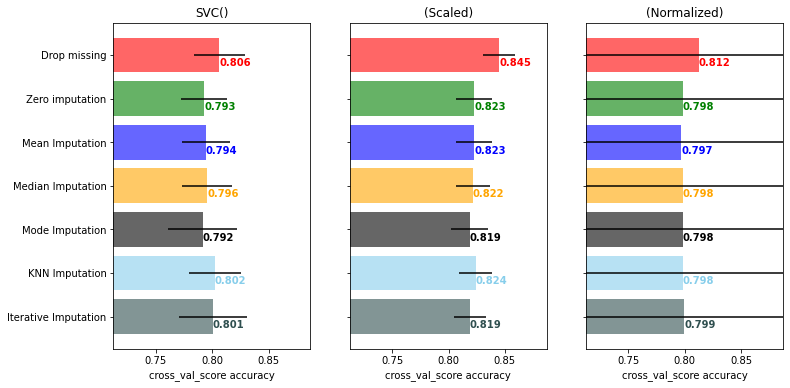

In [54]:
n_bars = len(mses_knn)
xval = np.arange(n_bars)

colors = ['r', 'g', 'b', 'orange', 'black', 'skyblue', 'darkslategray']
# plot results svc
plt.figure(figsize=(12, 6))
ax1 = plt.subplot(131)
for j in xval:
    ax1.barh(j, mses_svc[j], xerr=stds_svc[j], color=colors[j], alpha=0.6, align='center')
    ax1.text(mses_svc[j] , j + .25, str(round(mses_svc[j],3)), color=colors[j], fontweight='bold')

#ax1.set_title('LogisticRegression(C=0.01,penalty=\'l2\', solver=\'newton-cg\', random_state = 10)')
ax1.set_title('SVC()')
ax1.set_xlim(left=np.min(mses_svc) * 0.9, right=np.max(mses_svc) * 1.1)
ax1.set_yticks(xval)
ax1.set_xlabel('cross_val_score %s' % metric)
ax1.invert_yaxis()
ax1.set_yticklabels(x_labels)


# plot results svc scaled
ax2 = plt.subplot(132)
for j in xval:
    ax2.barh(j, mses_svc_scaled[j], xerr=stds_svc_scaled[j], color=colors[j], alpha=0.6, align='center')
    ax2.text(mses_svc_scaled[j] , j + .25, str(round(mses_svc_scaled[j],3)), color=colors[j], fontweight='bold')

ax2.set_title('(Scaled)')
ax2.set_xlim(left=np.min(mses_svc) * 0.9, right=np.max(mses_svc) * 1.1)
ax2.set_yticks(xval)
ax2.set_xlabel('cross_val_score %s' % metric)
ax2.invert_yaxis()
ax2.set_yticklabels([''] * n_bars)

# plot results svc minmax
ax3 = plt.subplot(133)
for j in xval:
    ax3.barh(j, mses_svc_minmax[j], xerr=mses_svc_minmax[j], color=colors[j], alpha=0.6, align='center')
    ax3.text(mses_svc_minmax[j] , j + .25, str(round(mses_svc_minmax[j],3)), color=colors[j], fontweight='bold')

ax3.set_title('(Normalized)')
ax3.set_xlim(left=np.min(mses_svc) * 0.9, right=np.max(mses_svc) * 1.1)
ax3.set_yticks(xval)
ax3.set_xlabel('cross_val_score %s' % metric)
ax3.invert_yaxis()
ax3.set_yticklabels([''] * n_bars)
plt.savefig("figures/1_visualization/preprocessing/svc.pdf")
plt.show()

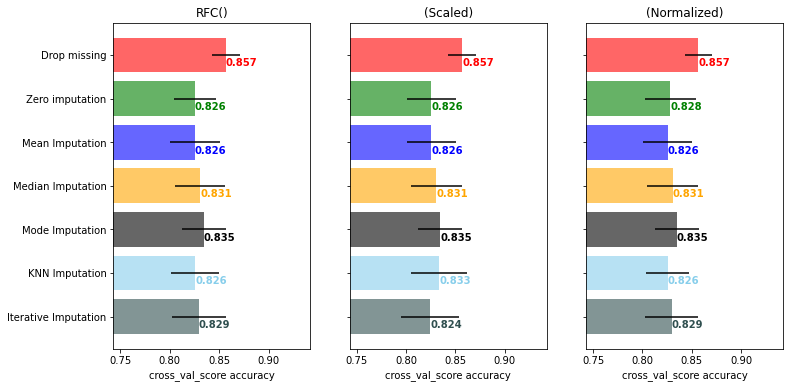

In [55]:
n_bars = len(mses_rfc)
xval = np.arange(n_bars)

colors = ['r', 'g', 'b', 'orange', 'black', 'skyblue', 'darkslategray']
# plot results svc
plt.figure(figsize=(12, 6))
ax1 = plt.subplot(131)
for j in xval:
    ax1.barh(j, mses_rfc[j], xerr=stds_rfc[j], color=colors[j], alpha=0.6, align='center')
    ax1.text(mses_rfc[j] , j + .25, str(round(mses_rfc[j],3)), color=colors[j], fontweight='bold')

#ax1.set_title('LogisticRegression(C=0.01,penalty=\'l2\', solver=\'newton-cg\', random_state = 10)')
ax1.set_title('RFC()')
ax1.set_xlim(left=np.min(mses_rfc) * 0.9, right=np.max(mses_rfc) * 1.1)
ax1.set_yticks(xval)
ax1.set_xlabel('cross_val_score %s' % metric)
ax1.invert_yaxis()
ax1.set_yticklabels(x_labels)


# plot results svc scaled
ax2 = plt.subplot(132)
for j in xval:
    ax2.barh(j, mses_rfc_scaled[j], xerr=stds_rfc_scaled[j], color=colors[j], alpha=0.6, align='center')
    ax2.text(mses_rfc_scaled[j] , j + .25, str(round(mses_rfc_scaled[j],3)), color=colors[j], fontweight='bold')

ax2.set_title('(Scaled)')
ax2.set_xlim(left=np.min(mses_rfc) * 0.9, right=np.max(mses_rfc) * 1.1)
ax2.set_yticks(xval)
ax2.set_xlabel('cross_val_score %s' % metric)
ax2.invert_yaxis()
ax2.set_yticklabels([''] * n_bars)

# plot results svc minmax
ax3 = plt.subplot(133)
for j in xval:
    ax3.barh(j, mses_rfc_minmax[j], xerr=stds_rfc_minmax[j], color=colors[j], alpha=0.6, align='center')
    ax3.text(mses_rfc_minmax[j] , j + .25, str(round(mses_rfc_minmax[j],3)), color=colors[j], fontweight='bold')

ax3.set_title('(Normalized)')
ax3.set_xlim(left=np.min(mses_rfc) * 0.9, right=np.max(mses_rfc) * 1.1)
ax3.set_yticks(xval)
ax3.set_xlabel('cross_val_score %s' % metric)
ax3.invert_yaxis()
ax3.set_yticklabels([''] * n_bars)
plt.savefig("figures/1_visualization/preprocessing/rfc.pdf")
plt.show()

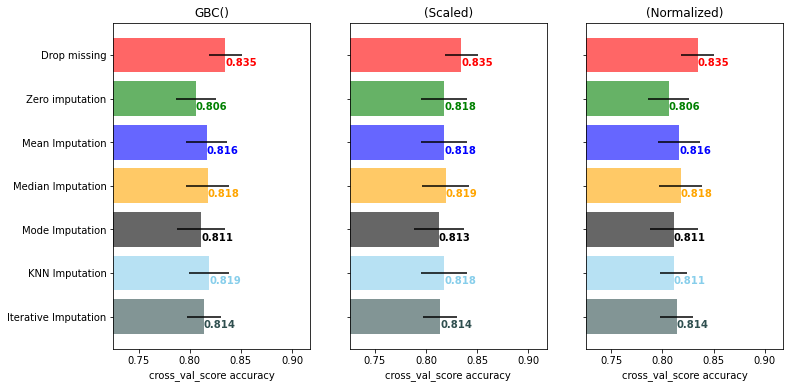

In [56]:
n_bars = len(mses_gbc)
xval = np.arange(n_bars)

colors = ['r', 'g', 'b', 'orange', 'black', 'skyblue', 'darkslategray']
# plot results svc
plt.figure(figsize=(12, 6))
ax1 = plt.subplot(131)
for j in xval:
    ax1.barh(j, mses_gbc[j], xerr=stds_gbc[j], color=colors[j], alpha=0.6, align='center')
    ax1.text(mses_gbc[j] , j + .25, str(round(mses_gbc[j],3)), color=colors[j], fontweight='bold')

#ax1.set_title('LogisticRegression(C=0.01,penalty=\'l2\', solver=\'newton-cg\', random_state = 10)')
ax1.set_title('GBC()')
ax1.set_xlim(left=np.min(mses_gbc) * 0.9, right=np.max(mses_gbc) * 1.1)
ax1.set_yticks(xval)
ax1.set_xlabel('cross_val_score %s' % metric)
ax1.invert_yaxis()
ax1.set_yticklabels(x_labels)


# plot results svc scaled
ax2 = plt.subplot(132)
for j in xval:
    ax2.barh(j, mses_gbc_scaled[j], xerr=stds_gbc_scaled[j], color=colors[j], alpha=0.6, align='center')
    ax2.text(mses_gbc_scaled[j] , j + .25, str(round(mses_gbc_scaled[j],3)), color=colors[j], fontweight='bold')

ax2.set_title('(Scaled)')
ax2.set_xlim(left=np.min(mses_gbc) * 0.9, right=np.max(mses_gbc) * 1.1)
ax2.set_yticks(xval)
ax2.set_xlabel('cross_val_score %s' % metric)
ax2.invert_yaxis()
ax2.set_yticklabels([''] * n_bars)

# plot results svc minmax
ax3 = plt.subplot(133)
for j in xval:
    ax3.barh(j, mses_gbc_minmax[j], xerr=stds_gbc_minmax[j], color=colors[j], alpha=0.6, align='center')
    ax3.text(mses_gbc_minmax[j] , j + .25, str(round(mses_gbc_minmax[j],3)), color=colors[j], fontweight='bold')

ax3.set_title('(Normalized)')
ax3.set_xlim(left=np.min(mses_gbc) * 0.9, right=np.max(mses_gbc) * 1.1)
ax3.set_yticks(xval)
ax3.set_xlabel('cross_val_score %s' % metric)
ax3.invert_yaxis()
ax3.set_yticklabels([''] * n_bars)
plt.savefig("figures/1_visualization/preprocessing/gbc.pdf")
plt.show()

In [96]:
from sklearn import tree

In [99]:
rfc.fit(X_train_no_nan, y_train_no_nan)

RandomForestClassifier(max_depth=3, random_state=10)

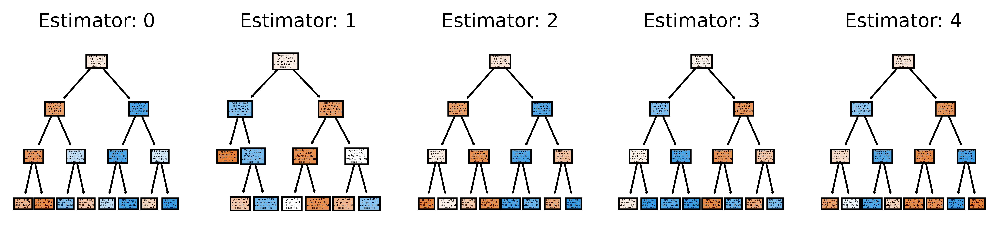

In [102]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=900)
for index in range(0, 5):
    tree.plot_tree(rfc.estimators_[index],
                   feature_names = cols, 
                   class_names='Severity',
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig("figures/1_visualization/preprocessing/plot_rfc.png")

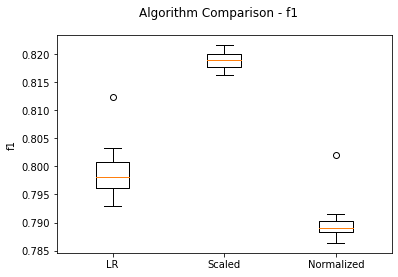

In [57]:
# evaluate each model in turn
results = []
names = []

results.append(mses_lr)
names.append('LR')
results.append(mses_lr_scaled)
names.append('Scaled')
results.append(mses_lr_minmax)
names.append('Normalized')

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison - %s' % metric)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel('f1')
ax.set_xticklabels(names)
plt.savefig("figures/1_visualization/preprocessing/lr_boxplot.pdf")
plt.show()

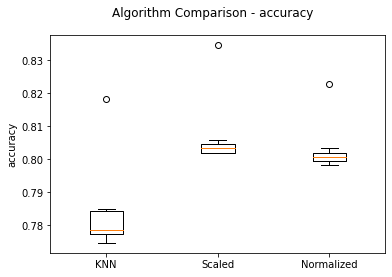

In [58]:
# evaluate each model in turn
results = []
names = []

results.append(mses_knn)
names.append('KNN')
results.append(mses_knn_scaled)
names.append('Scaled')
results.append(mses_knn_minmax)
names.append('Normalized')

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison - %s' % metric)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel(metric)
ax.set_xticklabels(names)
plt.savefig("figures/1_visualization/preprocessing/knn_boxplot.pdf")
plt.show()

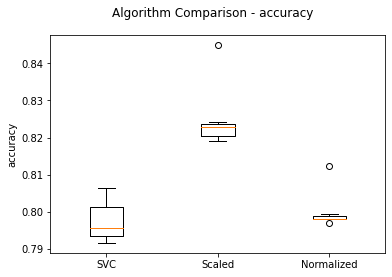

In [59]:
# evaluate each model in turn
results = []
names = []

results.append(mses_svc)
names.append('SVC')
results.append(mses_svc_scaled)
names.append('Scaled')
results.append(mses_svc_minmax)
names.append('Normalized')

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison - %s' % metric)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel(metric)
ax.set_xticklabels(names)
plt.savefig("figures/1_visualization/preprocessing/svc_boxplot.pdf")
plt.show()

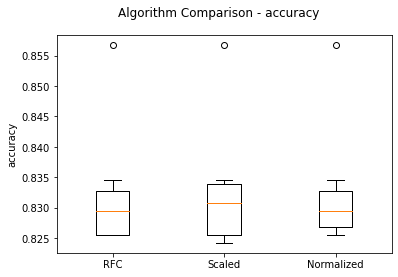

In [60]:
# evaluate each model in turn
results = []
names = []

results.append(mses_rfc)
names.append('RFC')
results.append(mses_rfc_scaled)
names.append('Scaled')
results.append(mses_rfc_minmax)
names.append('Normalized')

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison - %s' % metric)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel(metric)
ax.set_xticklabels(names)
plt.savefig("figures/1_visualization/preprocessing/rfc_boxplot.pdf")
plt.show()

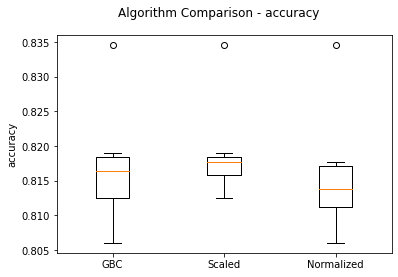

In [61]:
# evaluate each model in turn
results = []
names = []

results.append(mses_gbc)
names.append('GBC')
results.append(mses_gbc_scaled)
names.append('Scaled')
results.append(mses_gbc_minmax)
names.append('Normalized')

# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison - %s' % metric)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel(metric)
ax.set_xticklabels(names)
plt.savefig("figures/1_visualization/preprocessing/gbc_boxplot.pdf")
plt.show()

## Gráficas de curva ROC <a class="anchor" id="section_1_2"></a>

In [62]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [63]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import auc
from sklearn.metrics import plot_roc_curve

In [64]:
cv = StratifiedKFold(n_splits=N_SPLITS)

tprs_lr = []
aucs_lr = []
mean_fpr_lr = np.linspace(0, 1, 100)

In [65]:
best_lr = Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Shape']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer_num',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['BI-RADS', 'Age', 'Margin',
                                                   'Density'])])),
                ('clf',
                 LogisticRegression(C=0.01, random_state=10,
                                    solver='newton-cg'))])

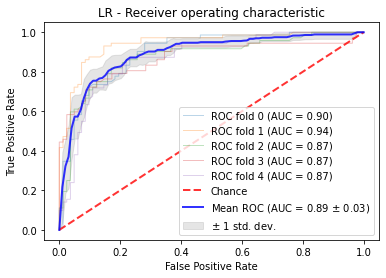

In [66]:
fig, ax = plt.subplots()
for i, (train, test) in enumerate(cv.split(X, y)):
    best_lr.fit(X.iloc[train], y.iloc[train])
    viz = plot_roc_curve(best_lr, X.iloc[test], y.iloc[test],
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr_lr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs_lr.append(interp_tpr)
    aucs_lr.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr_lr = np.mean(tprs_lr, axis=0)
mean_tpr_lr[-1] = 1.0
mean_auc_lr = auc(mean_fpr_lr, mean_tpr_lr)
std_auc_lr = np.std(aucs_lr)
ax.plot(mean_fpr_lr, mean_tpr_lr, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_lr, std_auc_lr),
        lw=2, alpha=.8)

std_tpr = np.std(tprs_lr, axis=0)
tprs_upper = np.minimum(mean_tpr_lr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr_lr - std_tpr, 0)
ax.fill_between(mean_fpr_lr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="LR - Receiver operating characteristic")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/lr.pdf")
plt.show()

In [67]:
best_knn = Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Shape']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer_num',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['BI-RADS', 'Age', 'Margin',
                                                   'Density'])])),
                ('clf',
                 KNeighborsClassifier(metric='manhattan', n_neighbors=16))])

In [68]:
cv = StratifiedKFold(n_splits=N_SPLITS)

tprs_knn = []
aucs_knn = []
mean_fpr_knn = np.linspace(0, 1, 100)

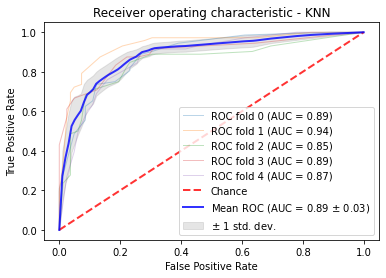

In [69]:
fig, ax = plt.subplots()
for i, (train, test) in enumerate(cv.split(X, y)):
    best_knn.fit(X.iloc[train], y.iloc[train])
    viz = plot_roc_curve(best_knn, X.iloc[test], y.iloc[test],
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr_knn, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs_knn.append(interp_tpr)
    aucs_knn.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr_knn = np.mean(tprs_knn, axis=0)
mean_tpr_knn[-1] = 1.0
mean_auc_knn = auc(mean_fpr_knn, mean_tpr_knn)
std_auc_knn = np.std(aucs_knn)
ax.plot(mean_fpr_knn, mean_tpr_knn, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_knn, std_auc_knn),
        lw=2, alpha=.8)

std_tpr = np.std(tprs_knn, axis=0)
tprs_upper = np.minimum(mean_tpr_knn + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr_knn - std_tpr, 0)
ax.fill_between(mean_fpr_knn, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver operating characteristic - KNN")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/knn.pdf")
plt.show()

In [70]:
best_svc = Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Shape']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer_num',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['BI-RADS', 'Age', 'Margin',
                                                   'Density'])])),
                ('clf', SVC(C=1, gamma='auto', random_state=10))])

In [71]:
cv = StratifiedKFold(n_splits=N_SPLITS)

tprs_svc = []
aucs_svc = []
mean_fpr_svc = np.linspace(0, 1, 100)

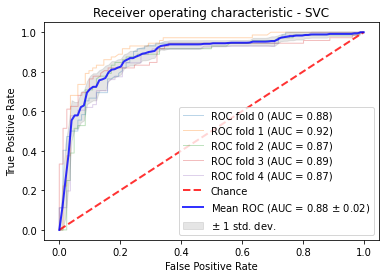

In [72]:
fig, ax = plt.subplots()
for i, (train, test) in enumerate(cv.split(X, y)):
    best_svc.fit(X.iloc[train], y.iloc[train])
    viz = plot_roc_curve(best_svc, X.iloc[test], y.iloc[test],
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr_svc, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs_svc.append(interp_tpr)
    aucs_svc.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr_svc = np.mean(tprs_svc, axis=0)
mean_tpr_svc[-1] = 1.0
mean_auc_svc = auc(mean_fpr_svc, mean_tpr_svc)
std_auc_svc = np.std(aucs_svc)
ax.plot(mean_fpr_svc, mean_tpr_svc, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_svc, std_auc_svc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs_svc, axis=0)
tprs_upper = np.minimum(mean_tpr_svc + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr_svc - std_tpr, 0)
ax.fill_between(mean_fpr_svc, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver operating characteristic - SVC")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/svc.pdf")
plt.show()

In [73]:
best_gbc = Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Shape']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer_num',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['BI-RADS', 'Age', 'Margin',
                                                   'Density'])])),
                ('clf',
                 GradientBoostingClassifier(n_estimators=1, random_state=10))])

In [74]:
cv = StratifiedKFold(n_splits=N_SPLITS)

tprs_gbc = []
aucs_gbc = []
mean_fpr_gbc = np.linspace(0, 1, 100)

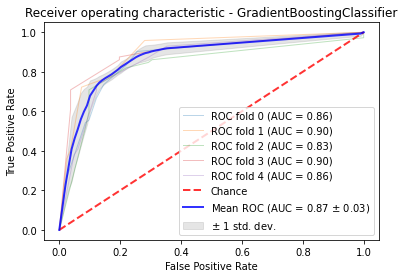

In [75]:
fig, ax = plt.subplots()
for i, (train, test) in enumerate(cv.split(X, y)):
    best_gbc.fit(X.iloc[train], y.iloc[train])
    viz = plot_roc_curve(best_gbc, X.iloc[test], y.iloc[test],
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr_gbc, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs_gbc.append(interp_tpr)
    aucs_gbc.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr_gbc= np.mean(tprs_gbc, axis=0)
mean_tpr_gbc[-1] = 1.0
mean_auc_gbc = auc(mean_fpr_gbc, mean_tpr_gbc)
std_auc_gbc = np.std(aucs_gbc)
ax.plot(mean_fpr_gbc, mean_tpr_gbc, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_gbc, std_auc_gbc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs_gbc, axis=0)
tprs_upper = np.minimum(mean_tpr_gbc + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr_gbc - std_tpr, 0)
ax.fill_between(mean_fpr_gbc, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver operating characteristic - GradientBoostingClassifier")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/gbc.pdf")
plt.show()

In [76]:
best_rfc = Pipeline(steps=[('pre',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Shape']),
                                                 ('num',
                                                  Pipeline(steps=[('imputer_num',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['BI-RADS', 'Age', 'Margin',
                                                   'Density'])])),
                ('clf', RandomForestClassifier(max_depth=1, random_state=10))])

In [77]:
cv = StratifiedKFold(n_splits=N_SPLITS)

tprs_rfc = []
aucs_rfc = []
mean_fpr_rfc = np.linspace(0, 1, 100)

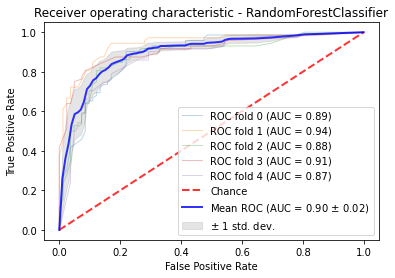

In [78]:
fig, ax = plt.subplots()
for i, (train, test) in enumerate(cv.split(X, y)):
    best_rfc.fit(X.iloc[train], y.iloc[train])
    viz = plot_roc_curve(best_rfc, X.iloc[test], y.iloc[test],
                         name='ROC fold {}'.format(i),
                         alpha=0.3, lw=1, ax=ax)
    interp_tpr = np.interp(mean_fpr_rfc, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs_rfc.append(interp_tpr)
    aucs_rfc.append(viz.roc_auc)

ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

mean_tpr_rfc = np.mean(tprs_rfc, axis=0)
mean_tpr_rfc[-1] = 1.0
mean_auc_rfc= auc(mean_fpr_rfc, mean_tpr_rfc)
std_auc_rfc = np.std(aucs_svc)
ax.plot(mean_fpr_rfc, mean_tpr_rfc, color='b',
        label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_rfc, std_auc_rfc),
        lw=2, alpha=.8)

std_tpr = np.std(tprs_rfc, axis=0)
tprs_upper = np.minimum(mean_tpr_rfc + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr_rfc - std_tpr, 0)
ax.fill_between(mean_fpr_rfc, tprs_lower, tprs_upper, color='grey', alpha=.2,
                label=r'$\pm$ 1 std. dev.')

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver operating characteristic - RandomForestClassifier")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/rfc.pdf")
plt.show()

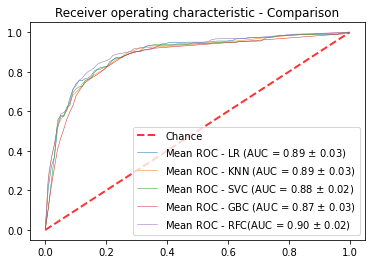

In [79]:
fig, ax = plt.subplots()
ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',
        label='Chance', alpha=.8)

ax.plot(mean_fpr_lr, mean_tpr_lr, 
        label=r'Mean ROC - LR (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_lr, std_auc_lr),linewidth=0.5)

ax.plot(mean_fpr_knn, mean_tpr_knn, 
        label=r'Mean ROC - KNN (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_knn, std_auc_knn), linewidth=0.5)

ax.plot(mean_fpr_svc, mean_tpr_svc, 
        label=r'Mean ROC - SVC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_svc, std_auc_svc), linewidth=0.5)

ax.plot(mean_fpr_gbc, mean_tpr_gbc, 
        label=r'Mean ROC - GBC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_gbc, std_auc_gbc), linewidth=0.5)

ax.plot(mean_fpr_rfc, mean_tpr_rfc, 
        label=r'Mean ROC - RFC(AUC = %0.2f $\pm$ %0.2f)' % (mean_auc_rfc, std_auc_rfc), linewidth=0.5)

ax.set(xlim=[-0.05, 1.05], ylim=[-0.05, 1.05],
       title="Receiver operating characteristic - Comparison")
ax.legend(loc="lower right")
plt.savefig("figures/1_visualization/roc/general_roc.pdf")
plt.show()

## Análisis de atributos <a class="anchor" id="section_1_3"></a>

In [80]:
import seaborn as sns

In [81]:
mamm_csv = "../data/mamografias.csv"

In [82]:
missing_values_format = ["?"]
mamm_data = pd.read_csv(mamm_csv, na_values=missing_values_format)
mamm_data.head()

,BI-RADS,Age,Shape,Margin,Density,Severity
0,5.0,67.0,L,5.0,3.0,maligno
1,4.0,43.0,R,1.0,NaN,maligno
2,5.0,58.0,I,5.0,3.0,maligno
3,4.0,28.0,R,1.0,3.0,benigno
4,5.0,74.0,R,5.0,NaN,maligno


In [83]:
shape_order = {'N': 1.0, 'R': 2.0, 'O': 3.0, 'L': 4.0, 'I': 5.0}
mamm_data['Shape'] = mamm_data['Shape'].map(shape_order)

In [84]:
corr_report = pd.DataFrame(mamm_data.corr())

In [85]:
print(corr_report.to_latex())

\begin{tabular}{lrrrrr}
\toprule
{} &   BI-RADS &       Age &     Shape &    Margin &   Density \\
\midrule
BI-RADS &  1.000000 &  0.288232 &  0.408609 &  0.412952 &  0.082207 \\
Age     &  0.288232 &  1.000000 &  0.330013 &  0.411355 &  0.028954 \\
Shape   &  0.408609 &  0.330013 &  1.000000 &  0.661947 &  0.096151 \\
Margin  &  0.412952 &  0.411355 &  0.661947 &  1.000000 &  0.109392 \\
Density &  0.082207 &  0.028954 &  0.096151 &  0.109392 &  1.000000 \\
\bottomrule
\end{tabular}



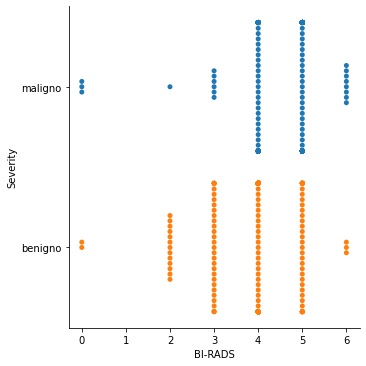

In [86]:
sns.catplot(x="BI-RADS", y="Severity", kind="swarm", data=mamm_data)

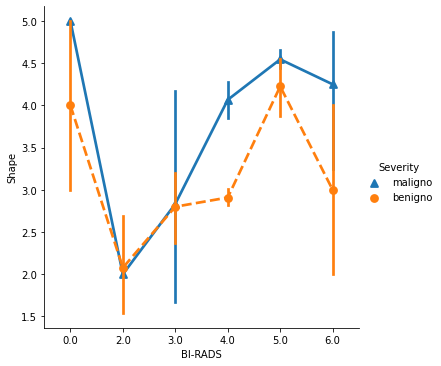

In [87]:
sns.catplot(x="BI-RADS", y="Shape", hue="Severity",
            markers=["^", "o"], linestyles=["-", "--"],
            kind="point", data=mamm_data)
plt.savefig("figures/1_visualization/attributes/birads_shape_severity.pdf")    

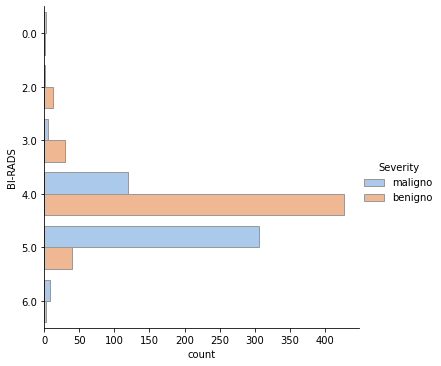

In [88]:
sns.catplot(y="BI-RADS", hue="Severity", kind="count",
            palette="pastel", edgecolor=".6",
            data=mamm_data)
plt.savefig("figures/1_visualization/attributes/birads_severity.pdf")            

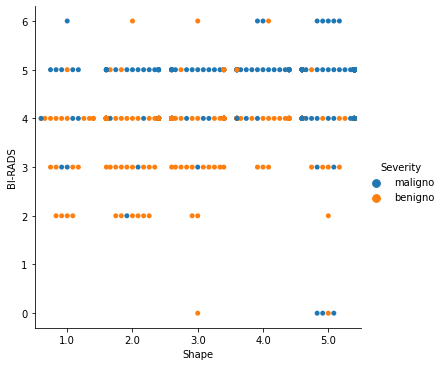

In [89]:
sns.catplot(x="Shape", y="BI-RADS", hue="Severity", kind="swarm", data=mamm_data)

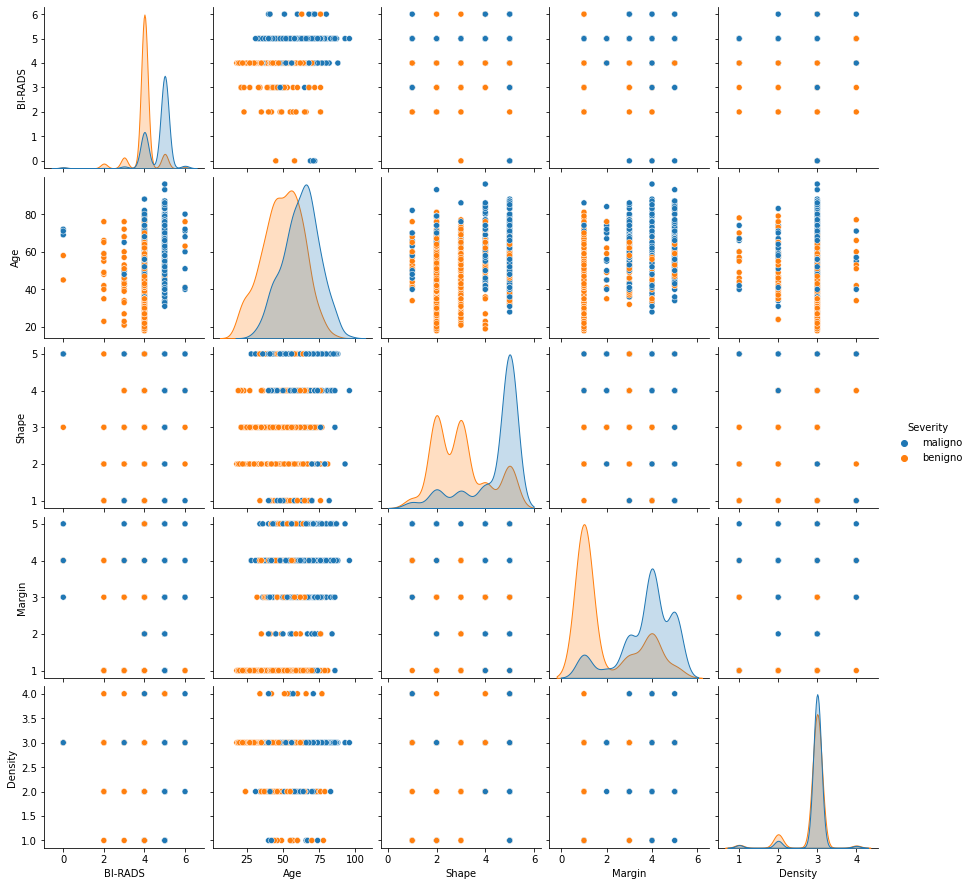

In [90]:
sns.pairplot(mamm_data, hue="Severity", vars=["BI-RADS", "Age", "Shape", "Margin", "Density"])
plt.savefig("figures/1_visualization/attributes/general_severity.png")

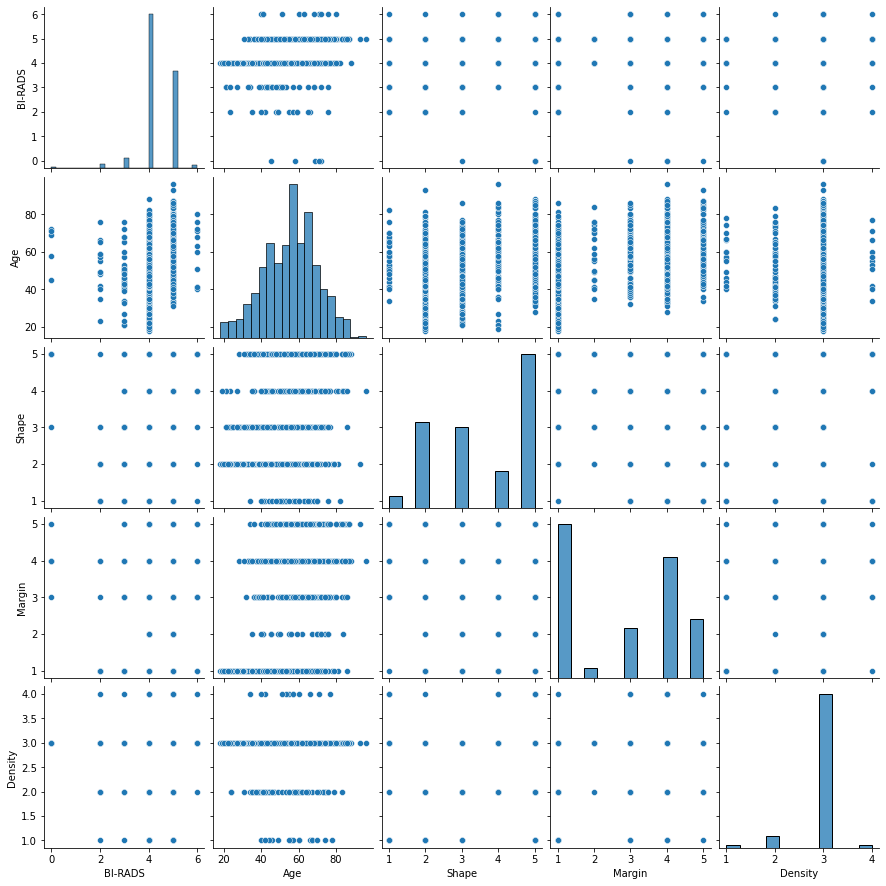

In [91]:
sns.pairplot(mamm_data)
plt.savefig("figures/1_visualization/attributes/general.png")

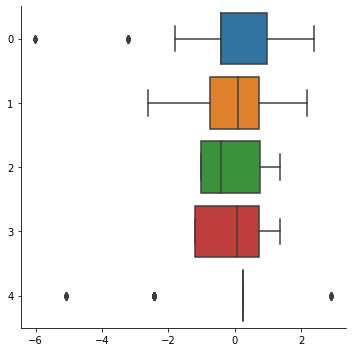

In [92]:
sns.catplot(data=pd.DataFrame(X_scaled), orient="h", kind="box")

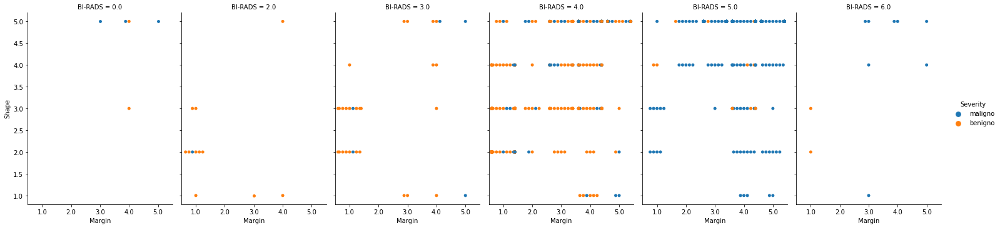

In [93]:
sns.catplot(x="Margin", y="Shape", hue="Severity",
            col="BI-RADS", aspect=.7,
            kind="swarm", data=mamm_data)
plt.savefig("figures/1_visualization/attributes/birads_shape_margin.pdf")

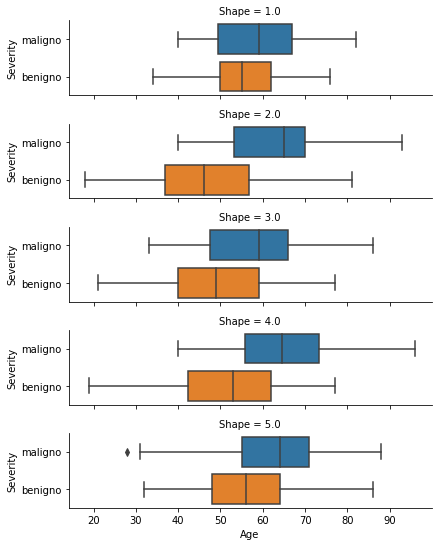

In [94]:
g = sns.catplot(x="Age", y="Severity", row="Shape",
                kind="box", orient="h", height=1.5, aspect=4,
                data=mamm_data)
#g.set(xscale="log")
plt.savefig("figures/1_visualization/attributes/box_shape_age_severity.pdf")

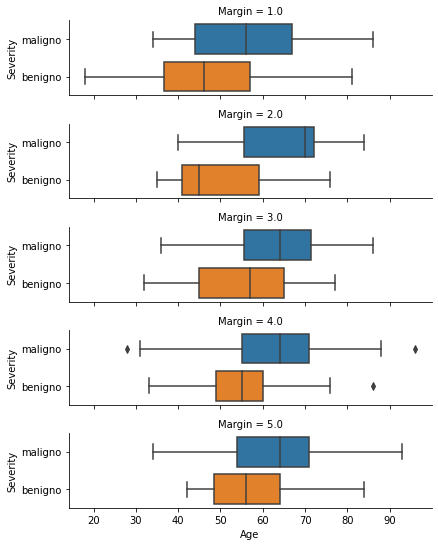

In [95]:
g = sns.catplot(x="Age", y="Severity", row="Margin",
                kind="box", orient="h", height=1.5, aspect=4,
                data=mamm_data)
#g.set(xscale="log")
plt.savefig("figures/1_visualization/attributes/box_margin_age_severity.pdf")